# **Building Detection Using Micrososft Bing Satellite Dataset**

In [ ]:
!pip install mercantile

In [ ]:
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np
from shapely import wkt
import json
from shapely.geometry import shape
from shapely import geometry
import mercantile
from tqdm import tqdm
import tempfile
import requests
from IPython.display import display, Image
from shapely.geometry import Point
from io import BytesIO

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **Sample Usage and .gojson Data Download**

In [ ]:
# Geometry copied from https://geojson.io
aoi_geom = {
    "coordinates": [
        [
            [-122.16484503187519, 47.69090474454916],
            [-122.16484503187519, 47.6217555345674],
            [-122.06529607517405, 47.6217555345674],
            [-122.06529607517405, 47.69090474454916],
            [-122.16484503187519, 47.69090474454916],
        ]
    ],
    "type": "Polygon",
}
aoi_shape = geometry.shape(aoi_geom)
minx, miny, maxx, maxy = aoi_shape.bounds

#output_fn = "/content/drive/MyDrive/Microsoft-Building-Dataset/goejson-outputs/example_building_footprints.geojson"

In [ ]:
quad_keys = set()
for tile in list(mercantile.tiles(minx, miny, maxx, maxy, zooms=9)):
    quad_keys.add(mercantile.quadkey(tile))
quad_keys = list(quad_keys)
print(f"The input area spans {len(quad_keys)} tiles: {quad_keys}")

The input area spans 1 tiles: ['021230030']


In [ ]:
output_fn = "/content/drive/MyDrive/Microsoft-Building-Dataset/goejson-outputs/example_building_footprints.geojson"
combined_gdf = combined_gdf.to_crs('EPSG:3857') #4326
combined_gdf.to_file(output_fn, driver='GeoJSON')

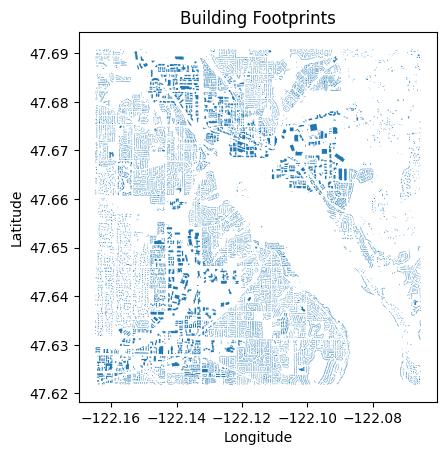

In [ ]:
geojson_path = '/content/drive/MyDrive/Microsoft-Building-Dataset/goejson-outputs/example_building_footprints.geojson'
gdf = gpd.read_file(geojson_path)

# Plot the building footprints
gdf.plot()
plt.title('Building Footprints')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [ ]:
location = 'Turkey'

dataset_links = pd.read_csv("https://minedbuildings.blob.core.windows.net/global-buildings/dataset-links.csv")
turkey_links = dataset_links[dataset_links.Location == location]

output_dir = "/content/drive/MyDrive/Microsoft-Building-Dataset/goejson-outputs-test/"
os.makedirs(output_dir, exist_ok=True)

for _, row in turkey_links.iterrows():

  df = pd.read_json(row.Url, lines=True)
  df['geometry'] = df['geometry'].apply(shape)
  gdf = gpd.GeoDataFrame(df, crs=3857) #4326
  output_path = os.path.join(output_dir, f"{row.QuadKey}.geojson")
  gdf.to_file(output_path, driver="GeoJSON")

In [ ]:
df = pd.read_csv(
    "https://minedbuildings.blob.core.windows.net/global-buildings/dataset-links.csv", dtype=str
)
df.head()

idx = 0
combined_gdf = gpd.GeoDataFrame()
with tempfile.TemporaryDirectory() as tmpdir:
    # Download the GeoJSON files for each tile that intersects the input geometry
    tmp_fns = []
    for quad_key in tqdm(quad_keys):
        rows = df[df["QuadKey"] == quad_key]
        if rows.shape[0] == 1:
            url = rows.iloc[0]["Url"]

            df2 = pd.read_json(url, lines=True)
            df2["geometry"] = df2["geometry"].apply(geometry.shape)

            gdf = gpd.GeoDataFrame(df2, crs=3857) #4326
            fn = os.path.join(tmpdir, f"{quad_key}.geojson")
            tmp_fns.append(fn)
            if not os.path.exists(fn):
                gdf.to_file(fn, driver="GeoJSON")
        elif rows.shape[0] > 1:
            raise ValueError(f"Multiple rows found for QuadKey: {quad_key}")
        else:
            raise ValueError(f"QuadKey not found in dataset: {quad_key}")

    # Merge the GeoJSON files into a single file
    for fn in tmp_fns:
        gdf = gpd.read_file(fn)  # Read each file into a GeoDataFrame
        gdf = gdf[gdf.geometry.within(aoi_shape)]  # Filter geometries within the AOI
        gdf['id'] = range(idx, idx + len(gdf))  # Update 'id' based on idx
        idx += len(gdf)
        combined_gdf = pd.concat([combined_gdf,gdf],ignore_index=True)

100%|██████████| 1/1 [03:02<00:00, 182.59s/it]
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
geojson_path = '/content/drive/MyDrive/Microsoft-Building-Dataset/goejson-outputs/example_building_footprints.geojson'
geo_path = '/content/drive/MyDrive/Microsoft-Building-Dataset/goejson-outputs-test/120322323.geojson'
gdf = gpd.read_file(geo_path)

# Extract centroid coordinates from the GeoDataFrame
gdf['centroid'] = gdf.geometry.centroid
coordinates = gdf['centroid'].apply(lambda point: (point.y, point.x)).tolist()

# Count the number of coordinates
num_coordinates = len(coordinates)
print(f"Number of images to expect: {num_coordinates}")


Number of images to expect: 3835


## **Download Training (GT and Mask) Images**

In [ ]:
# Define the path to your GeoJSON file
geojson_path = '/content/drive/MyDrive/Microsoft-Building-Dataset/goejson-outputs-test/120322323.geojson'

# Load the GeoJSON file using geopandas
gdf = gpd.read_file(geojson_path)

# Display the first few rows to understand the structure
gdf.head()


,type,properties,geometry
0,Feature,"{'height': -1.0, 'confidence': -1.0}","POLYGON ((26.346 41.216, 26.346 41.216, 26.346..."
1,Feature,"{'height': -1.0, 'confidence': -1.0}","POLYGON ((26.348 41.106, 26.348 41.106, 26.348..."
2,Feature,"{'height': -1.0, 'confidence': -1.0}","POLYGON ((26.350 41.108, 26.350 41.108, 26.350..."
3,Feature,"{'height': -1.0, 'confidence': -1.0}","POLYGON ((26.352 41.106, 26.352 41.106, 26.351..."
4,Feature,"{'height': -1.0, 'confidence': -1.0}","POLYGON ((26.352 41.085, 26.352 41.085, 26.352..."


In [ ]:
# Extract centroid coordinates from the GeoDataFrame
gdf['centroid'] = gdf.geometry.centroid
coordinates = gdf['centroid'].apply(lambda point: (point.y, point.x)).tolist()

# Display the first few coordinates
coordinates[:10]


[(41.21555244501085, 26.34581680089196),
 (41.10641015740583, 26.348185749407186),
 (41.10809633526999, 26.350171261698947),
 (41.106008585803544, 26.351495693711804),
 (41.0849398356064, 26.351658129790078),
 (41.16939548631762, 26.351877111885152),
 (41.10619029295941, 26.352408652304934),
 (41.24557291860834, 26.352456782431393),
 (41.17088289116656, 26.35313162305972),
 (41.10451931711018, 26.35328830888357)]

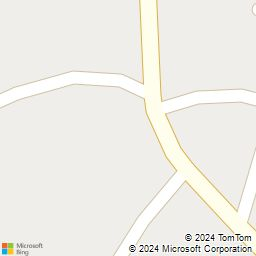

Getting Road map image...


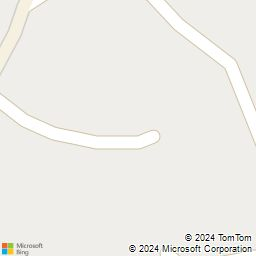

Getting Aerial map image...


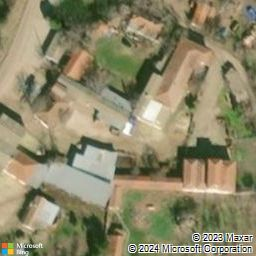

Getting AerialWithLabels map image...


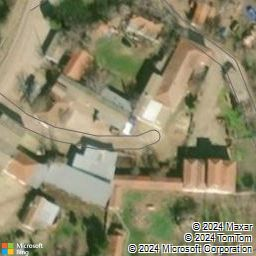

Getting Birdseye map image...
Error: 404
Getting BirdseyeWithLabels map image...
Error: 404
Getting CanvasLight map image...


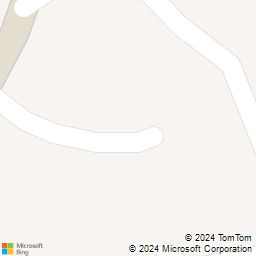

Getting CanvasDark map image...


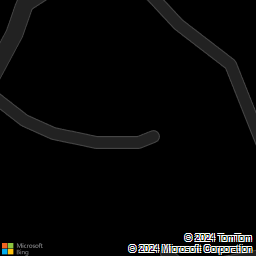

Getting CanvasGray map image...


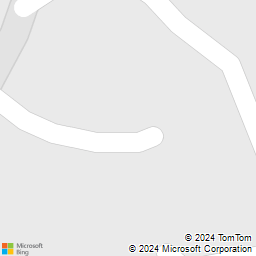

In [ ]:
import requests
from IPython.display import display, Image

def get_bing_map_image(api_key, center, zoom_level=18, map_size="256,256", imagery_set="Road"):
    url = f"http://dev.virtualearth.net/REST/V1/Imagery/Map/{imagery_set}/{center}/{zoom_level}?mapSize={map_size}&key={api_key}"
    response = requests.get(url)
    if response.status_code == 200:
        return Image(response.content)
    else:
        print(f"Error: {response.status_code}")
        return None

# Replace with your Bing Maps API key
api_key = 'AqfuYd9kGSHLWezmonCyb27Sl3gWMz8gEeMLav9ubv07bAugtlmRdpL_LpdvC2ph'

# Fetch and display images for the first 5 coordinates as an example
for coord in coordinates[:1]:
    center = f"{coord[0]},{coord[1]}"  # Latitude, Longitude
    image = get_bing_map_image(api_key, center)
    display(image)

center = '41.78289780682408, 26.735534779291466'  # Example coordinates (latitude, longitude)
zoom_level = 18
map_size = "256,256"

# Get different types of map images
imagery_sets = ["Road", "Aerial", "AerialWithLabels", "Birdseye", "BirdseyeWithLabels", "CanvasLight", "CanvasDark", "CanvasGray"]

for imagery_set in imagery_sets:
    print(f"Getting {imagery_set} map image...")
    img = get_bing_map_image(api_key, center, zoom_level, map_size, imagery_set)
    if img:
      display(img)


**Get Both Images and Footprints**

In [ ]:
import os
import requests
from PIL import Image, ImageDraw, ImageOps
import geopandas as gpd
from shapely.geometry import box
from pyproj import Transformer
import matplotlib.pyplot as plt

# Define the path to your GeoJSON file
geojson_path = '/content/drive/MyDrive/Microsoft-Building-Dataset/goejson-outputs/122101000.geojson'

# Load the GeoJSON file using geopandas
gdf = gpd.read_file(geojson_path)

# Ensure the GeoDataFrame is in the correct coordinate system (EPSG:4326)
if gdf.crs is None or gdf.crs.to_string() != 'EPSG:4326': #4326
    gdf = gdf.to_crs('EPSG:4326')

# Extract centroid coordinates from the GeoDataFrame
gdf['centroid'] = gdf.geometry.centroid
coordinates = gdf['centroid'].apply(lambda point: (point.y, point.x)).tolist()

print("Coordinates (EPSG:4326):", coordinates[:5])  # Print first 5 coordinates for verification

# Define the path to the GeoJSON files directory
geojson_dir = '/content/drive/MyDrive/Microsoft-Building-Dataset/goejson-outputs'
output_dir = '/content/drive/MyDrive/Microsoft-Building-Dataset/bing-maps-img-TURKEY/train-1'
output_dir_masks = '/content/drive/MyDrive/Microsoft-Building-Dataset/bing-maps-img-TURKEY/mask-1'
output_dir_combined = '/content/drive/MyDrive/Microsoft-Building-Dataset/bing-maps-img-TURKEY/combined-1'

idx_Start = 10
idx_End = 11
# Replace with your Bing Maps API key
api_key = 'AqfuYd9kGSHLWezmonCyb27Sl3gWMz8gEeMLav9ubv07bAugtlmRdpL_LpdvC2ph'

def get_bing_map_image(output_dir, api_key, center, idx, zoom_level=18, map_size="256,256", imagery_set="Aerial"):
    url = f"http://dev.virtualearth.net/REST/V1/Imagery/Map/{imagery_set}/{center}/{zoom_level}?mapSize={map_size}&key={api_key}"
    response = requests.get(url)
    if response.status_code == 200:
        img_path = os.path.join(output_dir, f'{idx}.jpg')
        with open(img_path, 'wb') as f:
            f.write(response.content)
        return img_path
    else:
        print(f"Error: {response.status_code}")
        return None

def save_footprint_image(gdf, coord, output_path, img_size=(256, 256), buffer_distance=0.0006):
    lon, lat = coord
    bbox = box(lon - buffer_distance, lat - buffer_distance, lon + buffer_distance, lat + buffer_distance)
    clipped_gdf = gdf[gdf.intersects(bbox)]

    #print(f"Number of geometries in clipped_gdf for coord ({lon}, {lat}): {len(clipped_gdf)}")

    image = Image.new('RGBA', img_size, (255, 255, 255, 0))
    draw = ImageDraw.Draw(image)

    for geom in clipped_gdf.geometry:
        if geom.geom_type == 'Polygon':
            exterior = [(int((x - (lon - buffer_distance)) * img_size[0] / (2 * buffer_distance)),
                         int((lat + buffer_distance - y) * img_size[1] / (2 * buffer_distance))) for x, y in geom.exterior.coords]
            draw.polygon(exterior, outline='red', fill='red' )

    image.save(output_path)

def overlay_images(base_image_path, overlay_image_path, output_path):
    base_image = Image.open(base_image_path).convert("RGBA")
    overlay_image = Image.open(overlay_image_path).convert("RGBA")

    combined_image = Image.alpha_composite(base_image, overlay_image)
    combined_image.save(output_path)

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)
os.makedirs(output_dir_masks, exist_ok=True)
os.makedirs(output_dir_combined, exist_ok=True)

for idx, geojson_file in enumerate(os.listdir(geojson_dir)):
    if idx < idx_Start:
        continue
    if idx >= idx_End:
        break
    if geojson_file.endswith('.geojson'):
        geojson_path = os.path.join(geojson_dir, geojson_file)

        # Load the GeoJSON file using geopandas
        gdf = gpd.read_file(geojson_path)

        # Ensure the GeoDataFrame is in EPSG:4326 coordinate system
        if gdf.crs is None or gdf.crs.to_string() != 'EPSG:4326':
            gdf = gdf.to_crs('EPSG:4326')

        # Extract centroid coordinates from the GeoDataFrame
        gdf['centroid'] = gdf.geometry.centroid
        coordinates = gdf['centroid'].apply(lambda point: (point.y, point.x)).tolist()

        # Create a subdirectory for the current GeoJSON file
        geojson_name = os.path.splitext(geojson_file)[0]
        geojson_output_dir = os.path.join(output_dir, geojson_name)
        os.makedirs(geojson_output_dir, exist_ok=True)

        geojson_output_dir_masks = os.path.join(output_dir_masks, geojson_name)
        os.makedirs(geojson_output_dir_masks, exist_ok=True)

        # Fetch and save images for all coordinates
        for idx, coord in enumerate(coordinates):
            if idx % 100 == 0:
                print(f"Processing coordinate {idx}...")
            center = f"{coord[0]},{coord[1]}"  # Latitude, Longitude
            base_image_path = get_bing_map_image(geojson_output_dir, api_key, center, idx)
            if base_image_path:
                footprint_path = os.path.join(geojson_output_dir_masks, f'{idx}.png')
                save_footprint_image(gdf, (coord[1], coord[0]), footprint_path)
                combined_output_path = os.path.join(output_dir_combined, f'{idx}.png')
                overlay_images(base_image_path, footprint_path, combined_output_path)

print("Processing complete.")

In [ ]:
import glob

saved = sorted(glob.glob("/content/drive/MyDrive/Microsoft-Building-Dataset/bing-maps-img-TURKEY/mask-1/122100303/*"))
print(len(saved))

4979


## **Plot Resuls**

-----------------------4326 OUTPUTS -----------------------


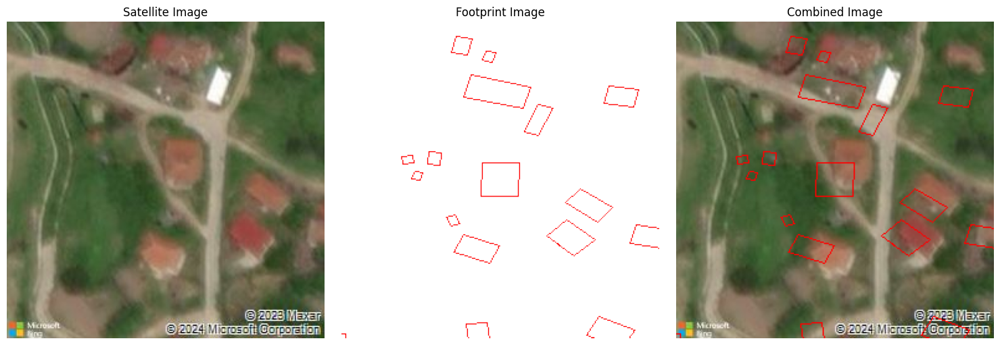

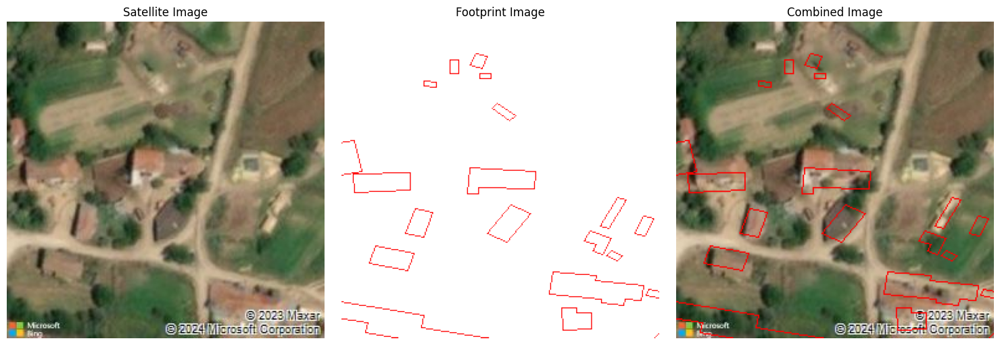

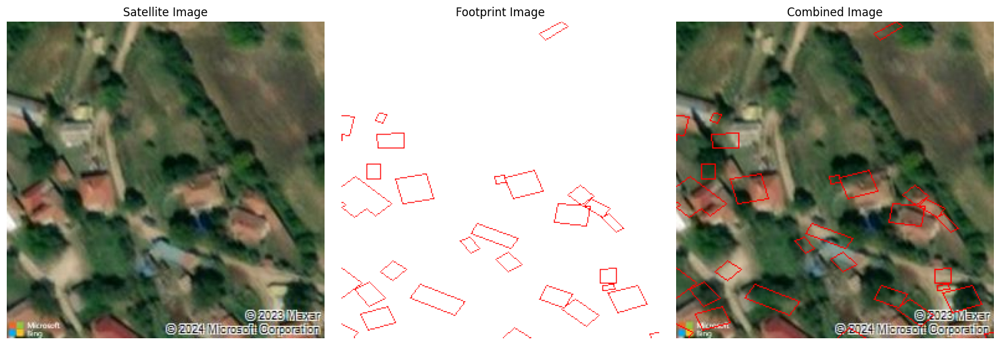

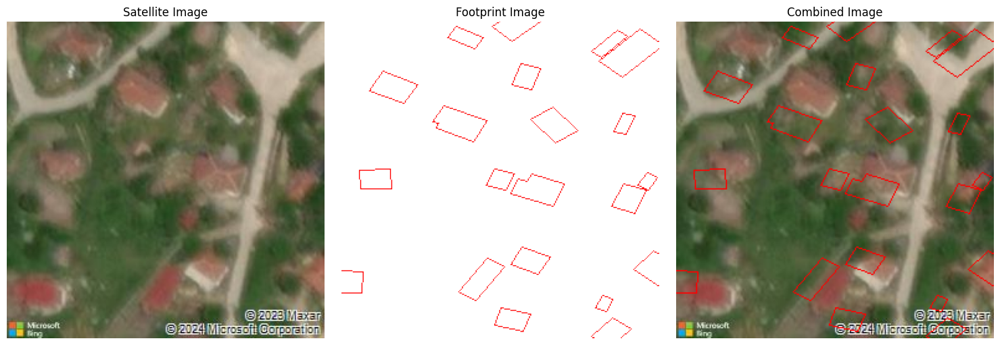

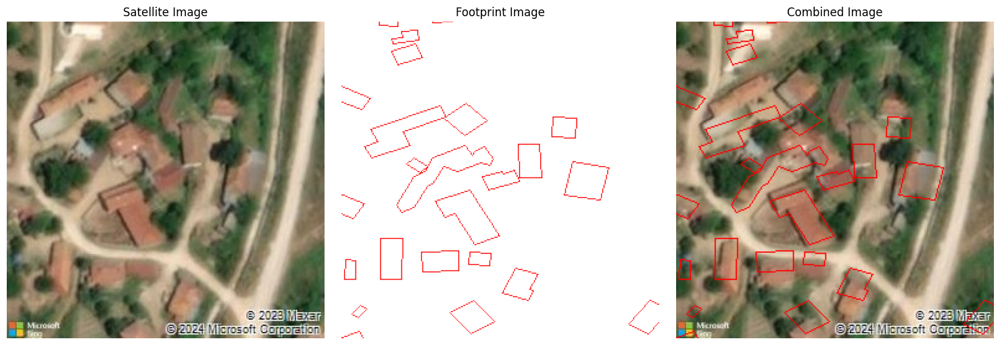

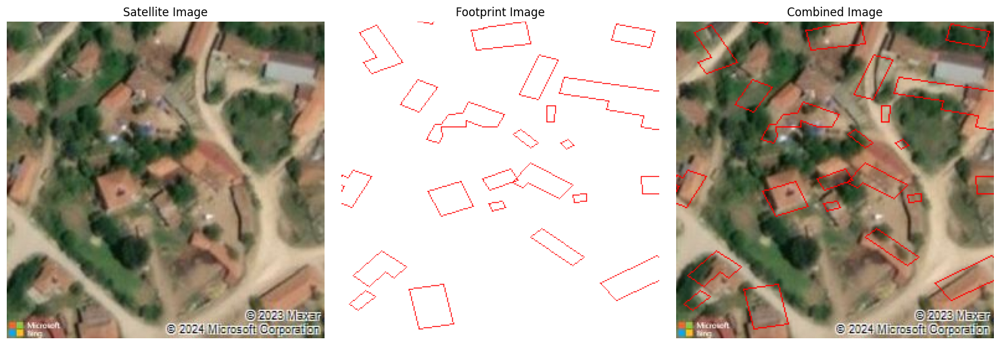

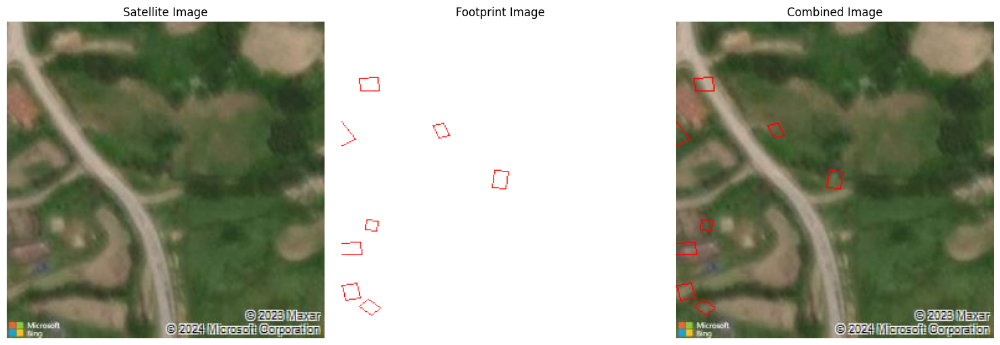

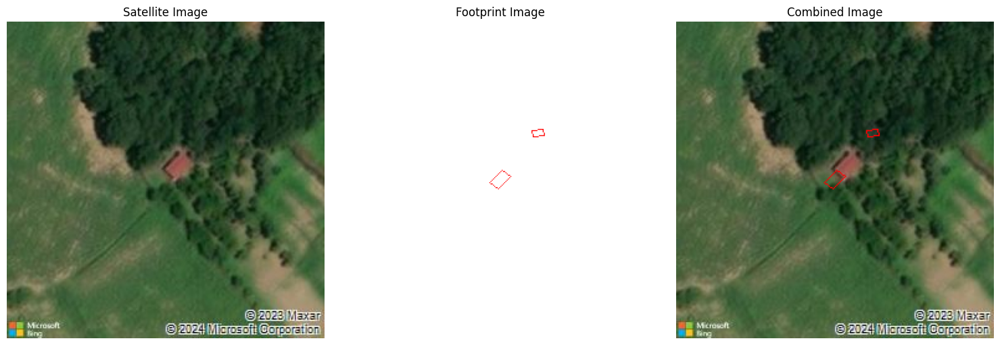

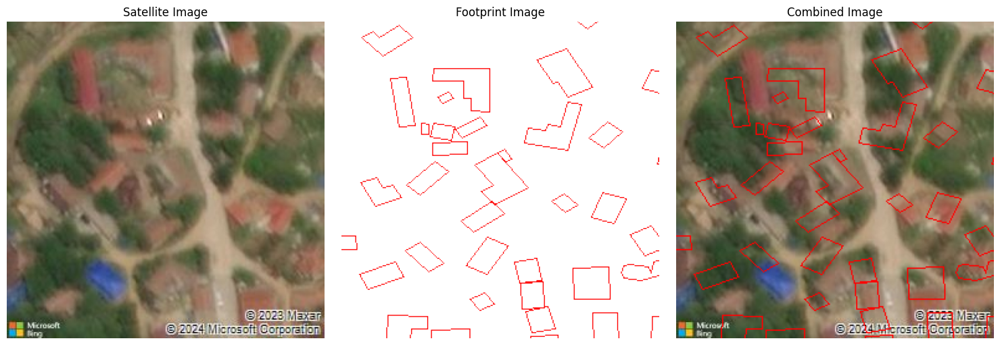

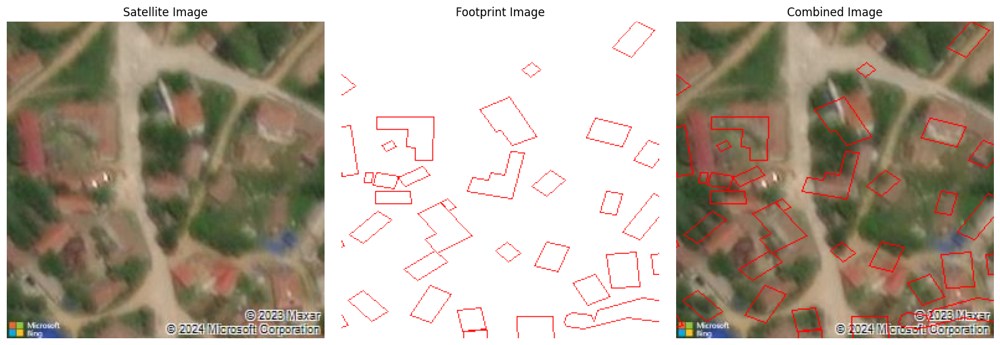

-----------------------3857 OUTPUTS -----------------------


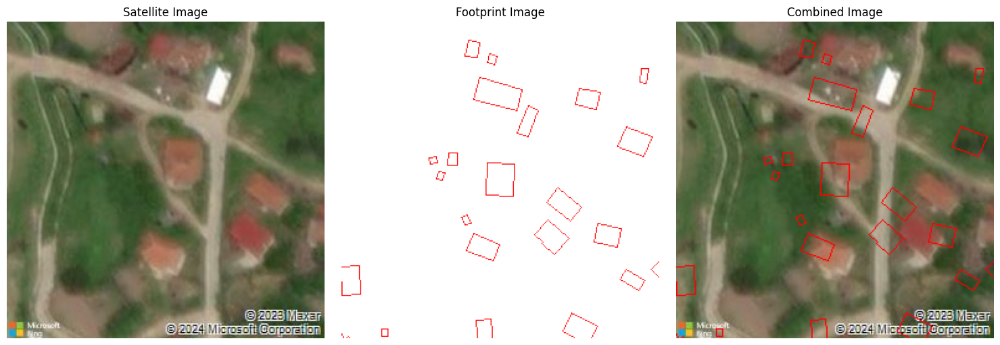

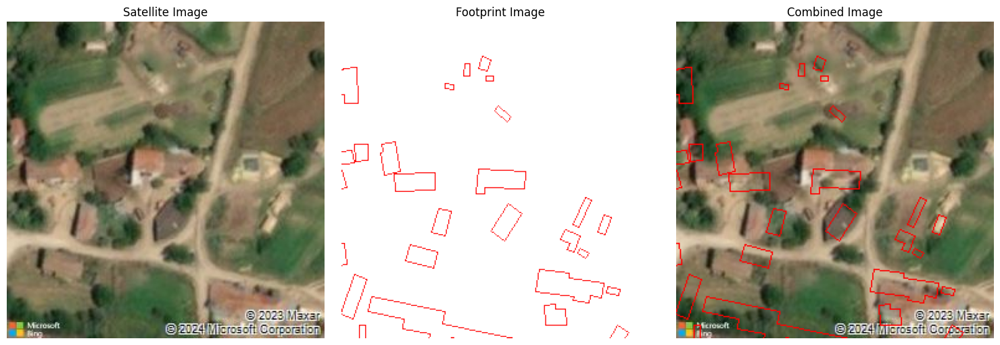

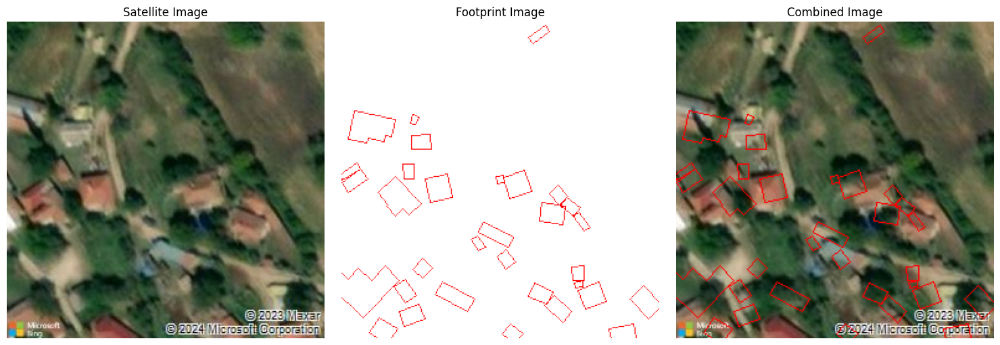

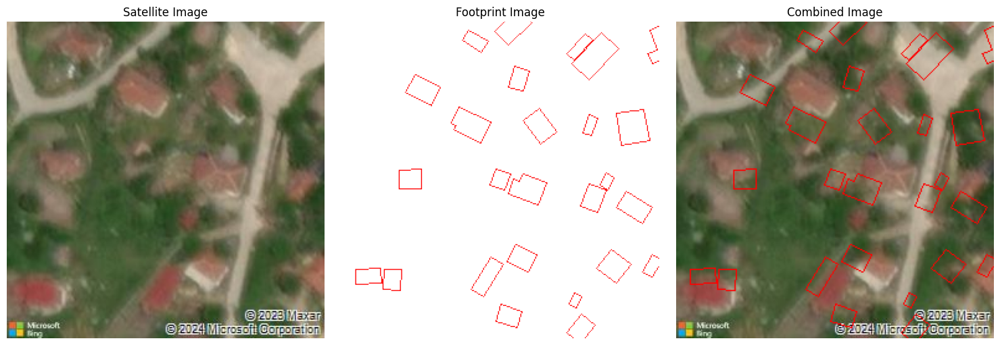

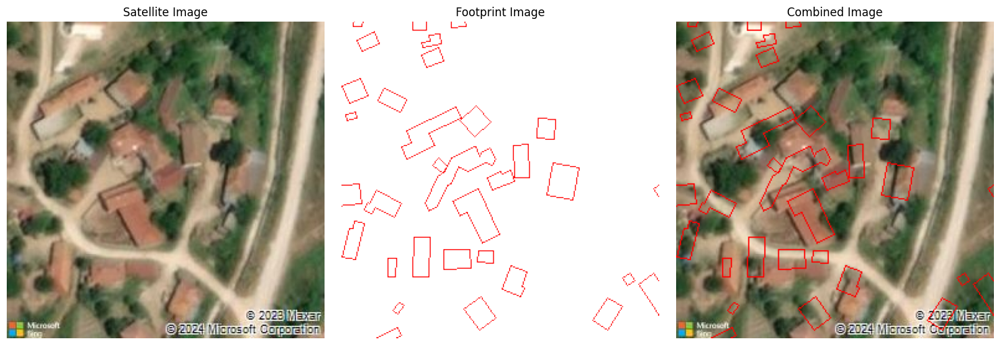

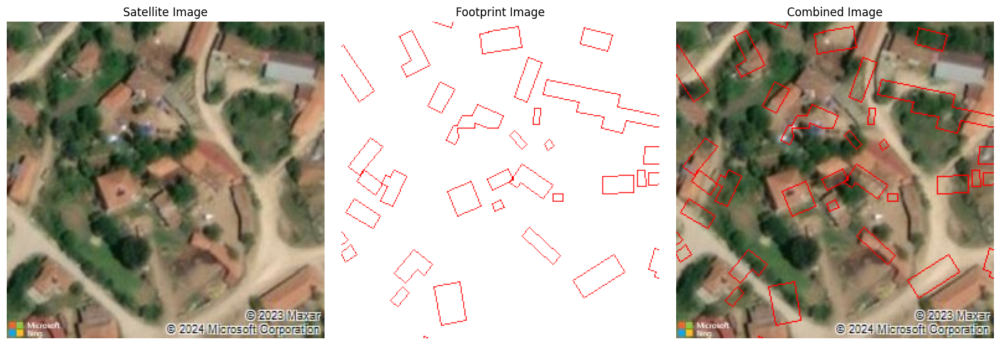

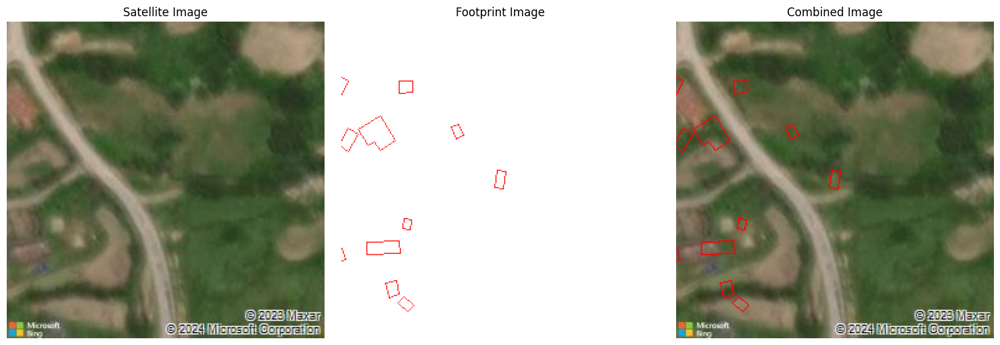

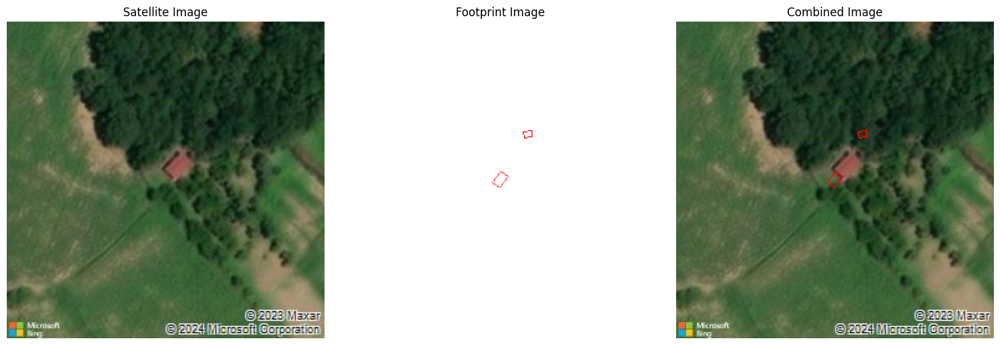

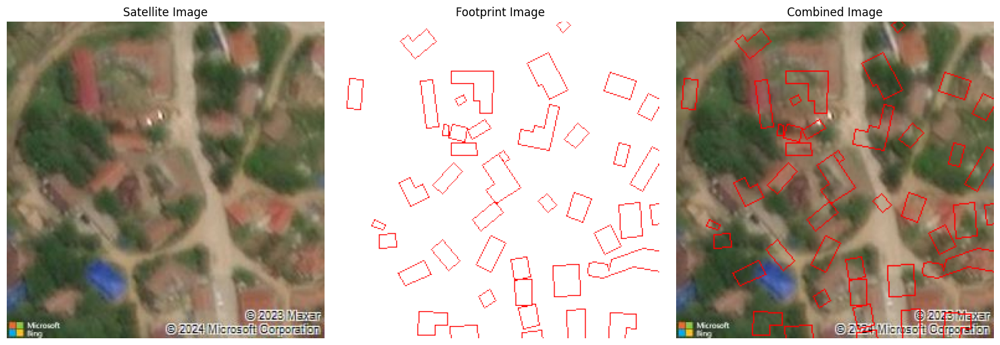

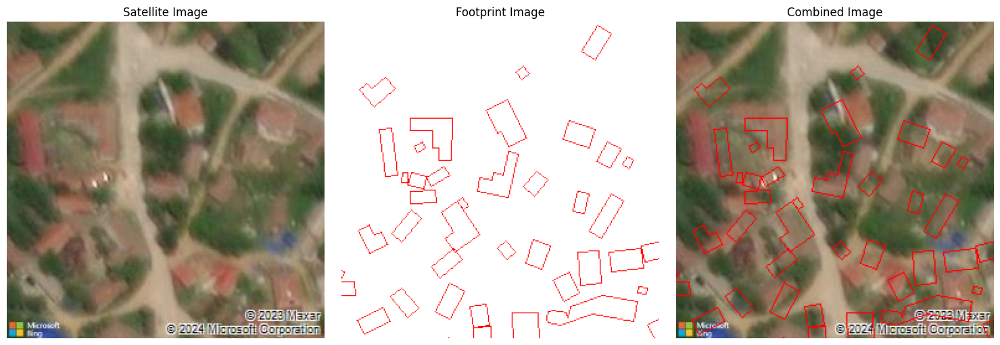

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageChops
# Define the paths to the images
satellite_image_path = '/content/drive/MyDrive/Microsoft-Building-Dataset/bing-maps-img-TURKEY/train/120322312/'
footprint_image_path = '/content/drive/MyDrive/Microsoft-Building-Dataset/bing-maps-img-TURKEY/mask/120322312/'

satellite_image_path_test = f'/content/drive/MyDrive/Microsoft-Building-Dataset/bing-maps-img-TURKEY/train-test/120322312/'
footprint_image_path_test = f'/content/drive/MyDrive/Microsoft-Building-Dataset/bing-maps-img-TURKEY/mask-test/120322312/'

def plot_images(satellite_image_path, footprint_image_path):
  for idx in range(11, 21):
      # Open the images
      footprint_path = os.path.join(footprint_image_path, f'{idx}.png')
      setellite_path = os.path.join(satellite_image_path, f'{idx}.jpg')

      satellite_image = Image.open(setellite_path).convert("RGBA")
      footprint_image = Image.open(footprint_path).convert("RGBA")

      # Ensure both images are the same size
      if satellite_image.size != footprint_image.size:
          footprint_image = footprint_image.resize(satellite_image.size, Image.ANTIALIAS)

      # Create a mask to isolate the footprint (non-white parts)
      datas = footprint_image.getdata()
      new_data = []
      for item in datas:
          # Change all white (also consider shades of whites)
          # pixels to transparent
          if item[0] > 200 and item[1] > 200 and item[2] > 200:
              new_data.append((255, 255, 255, 0))  # transparent
          else:
              new_data.append(item)  # keep other colors

      footprint_image.putdata(new_data)

      # Composite the images
      combined_image = Image.alpha_composite(satellite_image, footprint_image)

      # Plot the images
      fig, axes = plt.subplots(1, 3, figsize=(15, 5))

      # Plot the satellite image
      axes[0].imshow(satellite_image)
      axes[0].set_title('Satellite Image')
      axes[0].axis('off')

      # Plot the footprint image
      axes[1].imshow(footprint_image)
      axes[1].set_title('Footprint Image')
      axes[1].axis('off')

      # Plot the combined image
      axes[2].imshow(combined_image)
      axes[2].set_title('Combined Image')
      axes[2].axis('off')

      # Display the plots
      plt.tight_layout()
      plt.show()

print("-----------------------4326 OUTPUTS -----------------------")
plot_images(satellite_image_path, footprint_image_path)
print("-----------------------3857 OUTPUTS -----------------------")
plot_images(satellite_image_path_test, footprint_image_path_test)